In [1]:
# default libs
import os
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
# geo dfs
import pandas as pd
import geopandas as gpd
import contextily as cx

In [4]:
gdf = gpd.read_file("..\\data\\nwb_wegen.gpkg", engine='pyogrio', use_arrow=True)
#800MB file, first run took approx >120s without engines (didnt finish)
#with pyogrio and pyarrow: 10s but 1 UswerWarning

c:\Users\flori\!projects\noise-these\noise-thesis\.venv\Lib\site-packages\pyogrio\raw.py:287: UserWarning: More than one layer found in 'nwb_wegen.gpkg': 'wegvakken' (default), 'hectopunten'. Specify layer parameter to avoid this warning.
  with open_arrow(


In [14]:
gdf_u = gdf[gdf['gme_naam'] == 'Utrecht']

In [40]:
gdf_u[['objectid', 'wegnummer', 'wegdeelltr', 'stt_naam', 'gme_naam', 'geometry', 'bst_code', 'frc', 'rijrichtng', 'pos_tv_wol']].explore()

In [9]:
gdf.columns

Index(['objectid', 'wvk_id', 'wvk_begdat', 'jte_id_beg', 'jte_id_end',
       'wegbehsrt', 'wegnummer', 'wegdeelltr', 'hecto_lttr', 'bst_code',
       'rpe_code', 'admrichtng', 'rijrichtng', 'stt_naam', 'stt_bron',
       'wpsnaam', 'gme_id', 'gme_naam', 'hnrstrlnks', 'hnrstrrhts',
       'e_hnr_lnks', 'e_hnr_rhts', 'l_hnr_lnks', 'l_hnr_rhts', 'begafstand',
       'endafstand', 'beginkm', 'eindkm', 'pos_tv_wol', 'wegbehcode',
       'wegbehnaam', 'distrcode', 'distrnaam', 'dienstcode', 'dienstnaam',
       'wegtype', 'wgtype_oms', 'routeltr', 'routenr', 'routeltr2', 'routenr2',
       'routeltr3', 'routenr3', 'routeltr4', 'routenr4', 'wegnr_aw',
       'wegnr_hmp', 'geobron_id', 'geobron_nm', 'bronjaar', 'openlr',
       'bag_orl', 'frc', 'fow', 'alt_naam', 'alt_nr', 'rel_hoogte',
       'st_lengthshape', 'geometry'],
      dtype='object')

In [45]:
len(gdf.columns)

59

In [48]:
pd.set_option("display.max_colwidth", 50)  #default = 50, max= None
pd.set_option("display.max_columns", 75)
gdf_u.head()

,objectid,wvk_id,wvk_begdat,jte_id_beg,jte_id_end,wegbehsrt,wegnummer,wegdeelltr,hecto_lttr,bst_code,rpe_code,admrichtng,rijrichtng,stt_naam,stt_bron,wpsnaam,gme_id,gme_naam,hnrstrlnks,hnrstrrhts,e_hnr_lnks,e_hnr_rhts,l_hnr_lnks,l_hnr_rhts,begafstand,endafstand,beginkm,eindkm,pos_tv_wol,wegbehcode,wegbehnaam,distrcode,distrnaam,dienstcode,dienstnaam,wegtype,wgtype_oms,routeltr,routenr,routeltr2,routenr2,routeltr3,routenr3,routeltr4,routenr4,wegnr_aw,wegnr_hmp,geobron_id,geobron_nm,bronjaar,openlr,bag_orl,frc,fow,alt_naam,alt_nr,rel_hoogte,st_lengthshape,geometry
41,42,273314084.0,1998-06-26 00:00:00+00:00,273314118.0,273314119.0,G,,#,#,,#,,B,Melis Stokestraat,BAG schrijfwijze,Utrecht,344,Utrecht,,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,344,Utrecht,0.0,,,,,,,NaN,,NaN,,NaN,,NaN,,,10,Hartlijnenbestand Topografische Dienst,1996.0,CwOjxSUM6DPIAAAH//8zGA==,0344300000003206,6,3,,,NaN,5.099020,"MULTILINESTRING ((136579.000 457133.000, 13658..."
123,124,259314007.0,2002-07-01 00:00:00+00:00,259314035.0,259314043.0,G,,#,#,,#,,B,De Geer,BAG schrijfwijze,Vleuten,344,Utrecht,O,E,17.0,26.0,15.0,16.0,NaN,NaN,NaN,NaN,,344,Utrecht,0.0,,,,,,,NaN,,NaN,,NaN,,NaN,,,10,Hartlijnenbestand Topografische Dienst,1999.0,CwOSISUNUTPEAAAzACEzEw==,0344300000002240,6,3,,,NaN,50.813576,"MULTILINESTRING ((129941.000 457412.000, 12997..."
132,133,271302003.0,2002-10-01 00:00:00+00:00,271302058.0,271302064.0,G,,#,#,,#,,B,Noordersluis,BAG schrijfwijze,Utrecht,344,Utrecht,,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,344,Utrecht,0.0,,,,,,,NaN,,NaN,,NaN,,NaN,,,10,Hartlijnenbestand Topografische Dienst,1999.0,CwOhiSUDmCumAABCAA8rFg==,0344300000003229,5,3,,,NaN,47.759816,"MULTILINESTRING ((135717.000 451446.000, 13576..."
134,135,260315038.0,2002-10-01 00:00:00+00:00,260315016.0,260315024.0,G,,#,#,,#,,B,De Reit,BAG schrijfwijze,Vleuten,344,Utrecht,,B,NaN,17.0,NaN,18.0,NaN,NaN,NaN,NaN,,344,Utrecht,0.0,,,,,,,NaN,,NaN,,NaN,,NaN,,,10,Hartlijnenbestand Topografische Dienst,1999.0,CwOSVSUNyDPJAAAc//wzGQ==,0344300000003128,6,3,,,NaN,19.646883,"MULTILINESTRING ((130019.000 457696.000, 13003..."
272,273,261314061.0,2010-04-01 00:00:00+00:00,261314042.0,261314041.0,G,,#,#,,#,,B,Edmund Eyslerstraat,BAG schrijfwijze,Utrecht,344,Utrecht,E,E,58.0,62.0,58.0,60.0,NaN,NaN,NaN,NaN,,344,Utrecht,0.0,,,,,,,NaN,,NaN,,NaN,,NaN,,,30,Kaart Mutatiebeheerder (grafisch verantwoord),2008.0,CwOUPCUNdDPPAAAB/+gzHw==,0344300000001733,6,3,,,NaN,26.590348,"MULTILINESTRING ((130734.668 457491.549, 13073..."


In [22]:
gdf_u[['objectid', 'wegnummer', 'wegdeelltr', 'stt_naam', 'gme_naam', 'geometry', 'bst_code']]

,objectid,wegnummer,wegdeelltr,stt_naam,gme_naam,geometry,bst_code
41,42,,#,Melis Stokestraat,Utrecht,"MULTILINESTRING ((136579.000 457133.000, 13658...",
123,124,,#,De Geer,Utrecht,"MULTILINESTRING ((129941.000 457412.000, 12997...",
132,133,,#,Noordersluis,Utrecht,"MULTILINESTRING ((135717.000 451446.000, 13576...",
134,135,,#,De Reit,Utrecht,"MULTILINESTRING ((130019.000 457696.000, 13003...",
272,273,,#,Edmund Eyslerstraat,Utrecht,"MULTILINESTRING ((130734.668 457491.549, 13073...",
...,...,...,...,...,...,...,...
1550867,1550866,,#,Oude Vleutenseweg,Utrecht,"MULTILINESTRING ((133708.418 456527.053, 13370...",FP
1550891,1550890,,#,Asselijnstraat,Utrecht,"MULTILINESTRING ((136006.815 455117.409, 13600...",
1550942,1550943,,#,Polderstraat,Utrecht,"MULTILINESTRING ((135831.597 456933.791, 13583...",
1551025,1551025,012,R,De Meern 15,Utrecht,"MULTILINESTRING ((130155.480 453962.098, 13018...",AFR


In [25]:
gdf_u['frc'].value_counts()

frc
6    10979
7     5767
5     4977
4      326
2      171
3      143
1       75
0        5
Name: count, dtype: int64

In [32]:
gdf_um = gdf_u.dissolve(by='stt_naam').reset_index()
gdf_um[['objectid', 'stt_naam', 'wegnummer', 'wegdeelltr', 'gme_naam', 'geometry', 'bst_code']]

,objectid,stt_naam,wegnummer,wegdeelltr,gme_naam,geometry,bst_code
0,968393,'t Goylaan,,#,Utrecht,"MULTILINESTRING ((136601.176 453138.834, 13663...",FP
1,120939,'t Goyplein,,#,Utrecht,"MULTILINESTRING ((137165.000 453024.000, 13716...",GRB
2,1381651,'t Hoog,,#,Utrecht,"MULTILINESTRING ((128047.036 457327.707, 12805...",
3,317832,'t Loolaantje,,#,Utrecht,"MULTILINESTRING ((138175.465 455444.055, 13818...",FP
4,246516,'t Spijck,,#,Utrecht,"LINESTRING (126641.728 457284.451, 126644.748 ...",
...,...,...,...,...,...,...,...
3763,1214503,Zwanenvechtplein,,#,Utrecht,"MULTILINESTRING ((134811.671 458645.903, 13481...",
3764,205950,Zwartbontstraat,,#,Utrecht,"LINESTRING (138354.464 457343.664, 138363.057 ...",
3765,1162359,Zwarte Woud,,#,Utrecht,"MULTILINESTRING ((138178.257 452824.230, 13817...",
3766,172095,Zwartewater,,#,Utrecht,"MULTILINESTRING ((136399.882 456927.064, 13640...",FP


In [38]:
# gdf_um.simplify(tolerance=100).explore()

In [ ]:
"""buffered = gdf.buffer(1)  # Adjust the buffer distance as needed
dissolved = buffered.unary_union

# Simplify the dissolved geometries
simplified = dissolved.simplify(1)  # Adjust the simplification tolerance as needed

# Convert back to LineStrings
if isinstance(simplified, MultiLineString):
    simplified_lines = [LineString(line.coords) for line in simplified]
else:
    simplified_lines = [LineString(simplified.coords)]

# Create a new GeoDataFrame
simplified_gdf = gpd.GeoDataFrame(geometry=simplified_lines, crs=gdf.crs)"""

In [105]:
import geopandas as gpd
from shapely.geometry import LineString, MultiPolygon, Polygon
from shapely.ops import unary_union

# Load the data
gdf = gdf_u[gdf_u['stt_naam'] == 'Rijksweg 2']

# Buffer the lines to combine close ones
buffered = gdf.buffer(15)  # Adjust the buffer distance as needed
dissolved = unary_union(buffered)
dissolved = dissolved.simplify(50)

# # Ensure the dissolved geometries are polygons and then extract their boundaries
# if isinstance(dissolved, MultiPolygon):
#     simplified_lines = [LineString(p.exterior) for p in dissolved]
#     print('hi')
# elif isinstance(dissolved, Polygon):
#     simplified_lines = [LineString(dissolved.exterior)]
#     print('nvm')
# else:
#     raise TypeError("Unexpected geometry type: {}".format(type(dissolved)))

# Ensure the dissolved geometries are polygons and then extract their boundaries
if isinstance(dissolved, MultiPolygon):
    polygons = dissolved
elif isinstance(dissolved, Polygon):
    polygons = [dissolved]
else:
    raise TypeError("Unexpected geometry type: {}".format(type(dissolved)))

centerlines = []

for poly in polygons:
    exterior_coords = list(poly.exterior.coords)

    # Find the two longest segments
    segment_lengths = [LineString([exterior_coords[i], exterior_coords[i+1]]).length
                       for i in range(len(exterior_coords) - 1)]
    
    sorted_segments = sorted(range(len(segment_lengths)), key=lambda i: segment_lengths[i], reverse=True)
    longest_segments = sorted_segments[:2]

    # Find the midpoints of the two longest segments
    midpoints = []
    for i in longest_segments:
        p1, p2 = exterior_coords[i], exterior_coords[i+1]
        midpoint = ((p1[0] + p2[0]) / 2, (p1[1] + p2[1]) / 2)
        midpoints.append(midpoint)

    # Create a line between the midpoints of the two longest segments
    centerline = LineString(midpoints)
    centerlines.append(centerline)

# Create a new GeoDataFrame
centerline_gdf = gpd.GeoDataFrame(geometry=centerlines, crs=gdf.crs)
# simplified_lines = [create_central_line(polygon) for polygon in polygons]


# Create a new GeoDataFrame
simplified_gdf = gpd.GeoDataFrame(geometry=simplified_lines, crs=gdf.crs)

# Optional: Perform a spatial join to assign attributes
# joined = gpd.sjoin(simplified_gdf, gdf, how='left', op='intersects')
centerline_gdf.explore()



In [108]:
centerline_gdf.segment(50).explore()

AttributeError: 'GeoDataFrame' object has no attribute 'segment'

In [107]:
polygons.segment(50)

AttributeError: 'list' object has no attribute 'segment'

In [76]:
from shapely import LineString, MultiLineString


gdf_int = gdf_u[gdf_u['stt_naam'] == 'Rijksweg 2']
gdf_int = gdf_int.buffer(1)
gdf_int = gdf_int.unary_union
gdf_int = gdf_int.simplify(1)
# gdf_int = gdf_int.remove_repeated_points()

# if isinstance(gdf_int, MultiLineString):
#     gdf_int = [LineString(line.coords) for line in gdf_int]
# else:
#     gdf_int = [LineString(gdf_int.coords)]

# gdf_int = gpd.GeoDataFrame(geometry=simplified_lines, crs=gdf_u.crs)


AttributeError: 'MultiPolygon' object has no attribute 'remove_repeated_points'

In [77]:
gdf_int = gpd.GeoDataFrame(geometry=[gdf_int], crs=gdf_u.crs)
gdf_int.explore()


In [63]:
print(gdf_int)

MULTIPOLYGON (((132944.0650504648 451939.09046065237, 132938.77144239633 451941.66097523173, 133003.26869178138 452188.3744872874, 133014.7608324568 452211.5935900867, 133330.81919247285 453423.30661215365, 133499.88713607154 454140.46571991744, 133499.0808136113 454152.9248725633, 133571.77485843166 454430.81576174404, 133606.4697098883 454595.4518398332, 133633.40254012545 454755.74644695973, 133642.72336787515 454859.8329394751, 133646.34457282067 455017.2259672632, 133643.69704267936 455147.46471619984, 133635.1570330535 455262.6451873408, 133620.70469876166 455377.3435273037, 133598.61646731023 455501.14431371813, 133544.71419569445 455713.5666863389, 133491.91216911873 455868.1631715101, 133428.9530332255 456018.52116678003, 133113.31345185722 456692.79496376385, 133033.43312356563 456850.23742542067, 132938.0112010973 457016.28971032717, 132832.31766901398 457181.63479621656, 132709.1842701536 457353.0687456065, 132574.53898608143 457519.7022055429, 132450.52883975228 457657.664

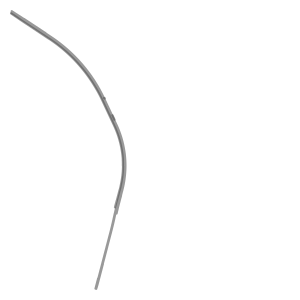

In [68]:
gdf_int 